# Alvaro Austin - 2106752180

## Soal 1

### Importings

In [5]:
import cv2
import numpy as np
from skimage import data
from skimage.util import img_as_float
from skimage.feature import (
    corner_harris,
    corner_subpix,
    corner_peaks,
    plot_matches
)
from skimage.transform import warp, AffineTransform
from skimage.exposure import rescale_intensity
from skimage.color import rgb2gray
from skimage.measure import ransac
from skimage import io, util, color
from cv2 import matchTemplate, TM_CCOEFF_NORMED, rectangle


### Part A

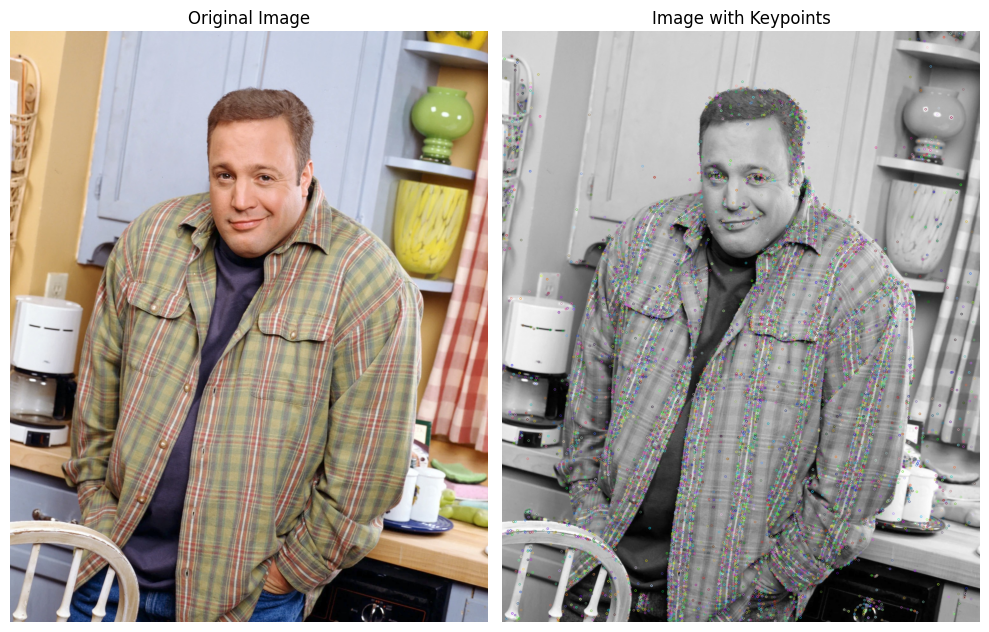

In [6]:
# Important NOTE: Use opencv >=4.4
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

img1 = cv2.imread('ori_kevin_james.jpg')

gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

sift = cv2.xfeatures2d.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)

img_1 = cv2.drawKeypoints(gray1,keypoints_1,img1)

# Display the images
plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(cv2.imread('ori_kevin_james.jpg'), cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB))
plt.title('Image with Keypoints')
plt.axis('off')

plt.tight_layout()
plt.show()

Berikut adalah langkah-langkah proses yang dijalankan dalam kode tersebut:

1. Membaca Gambar
```
img1 = cv2.imread('ori_kevin_james.jpg')
```
Gambar yang dimasukkan dalam format BGR dibaca ke dalam variabel img1. Gambar ini akan digunakan untuk mendeteksi fitur.
2. Mengonversi Gambar ke Grayscale
```
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
```
Sebelum algoritma SIFT diterapkan, gambar dikonversi dari format warna (BGR) ke grayscale. Ini karena SIFT bekerja lebih efisien dengan gambar grayscale, dan fitur intensitas piksel lebih relevan dalam pencarian keypoints daripada informasi warna.

3. Membuat Objek SIFT
```
sift = cv2.xfeatures2d.SIFT_create()
```
Pada langkah ini, SIFT diciptakan sebagai objek menggunakan fungsi `SIFT_create()`. Ini memungkinkan akses ke metode deteksi keypoints dan descriptior.
4. Deteksi Keypoints dan Descriptor
```
keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
```
Metode detectAndCompute digunakan untuk mendeteksi keypoints pada gambar. Proses ini mencakup:
- Deteksi Keypoints: Algoritma SIFT memindai gambar untuk mendeteksi titik-titik penting yang stabil terhadap perubahan skala dan rotasi. Ini dilakukan melalui penerapan transformasi Laplacian of Gaussian (LoG) yang menyaring area yang mengandung perubahan intensitas (contohnya sudut dan tepi).

- Pembuatan Description Fitur: Setelah keypoints terdeteksi, SIFT membangun descriptor yang merepresentasikan lingkungan lokal dari tiap keypoints dalam bentuk vektor berdimensi tinggi. Vektor ini menggambarkan pola gradien intensitas di sekitar keypoints, memungkinkan fitur tersebut tetap stabil terhadap variasi geometris dan pencahayaan.

5. Menggambar keypoints pada Gambar
```
img_1 = cv2.drawKeypoints(gray1, keypoints_1, img1)
```
Metode `drawKeypoints` digunakan untuk menggambar titik-keypoints yang terdeteksi pada gambar. Setiap keypoints digambar sebagai lingkaran kecil di lokasi yang terdeteksi, dengan orientasi yang menunjukkan arah gradien lokal di sekitarnya.

6. Menampilkan gambar
Di bagian akhir, gambar asli dan gambar dengan titik-keypoints ditampilkan berdampingan menggunakan matplotlib. Gambar asli ditampilkan di subplot pertama, dan gambar dengan keypoints ditampilkan di subplot kedua.

### Part B

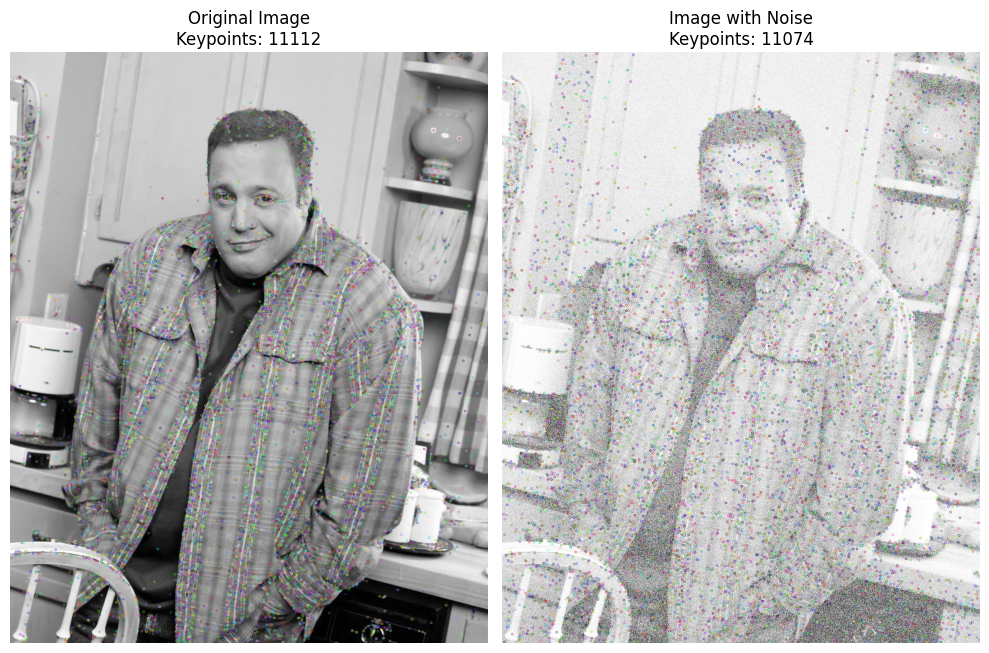

In [7]:
img2 = cv2.imread('noise_kevin_james.jpg')

gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

keypoints_2, descriptors_2 = sift.detectAndCompute(img2, None)

img_2 = cv2.drawKeypoints(gray2, keypoints_2, img2)

# Tampilkan hasil deteksi
plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.title(f'Original Image\nKeypoints: {len(keypoints_1)}')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB))
plt.title(f'Image with Noise\nKeypoints: {len(keypoints_2)}')
plt.axis('off')

plt.tight_layout()
plt.show()

Dari gambar yang ditampilkan, terdapat dua gambar yang dibandingkan: gambar asli dan gambar dengan noise, serta perbedaan jumlah keypoints yang terdeteksi menggunakan algoritma SIFT.

Perbandingan Keypoints:
- Gambar Asli: Pada gambar asli, terdeteksi 11112 keypoints.
- Gambar dengan Noise: Pada gambar dengan noise, terdeteksi 11074 keypoints.

Meskipun terdapat penambahan noise, jumlah keypoints yang terdeteksi pada gambar dengan noise tidak jauh berbeda dengan gambar asli. Hanya ada sedikit penurunan dalam jumlah keypoints (sekitar 38 keypoints lebih sedikit).


Pengaruh Noise terhadap Deteksi Fitur:
1. Stabilitas SIFT terhadap Noise: Algoritma SIFT dirancang agar relatif tahan terhadap gangguan seperti noise, skala, dan rotasi. Oleh karena itu, meskipun terdapat noise di gambar kedua, SIFT masih mampu mendeteksi sebagian besar keypoints yang ada di gambar asli. Hal ini disebabkan karena SIFT mengandalkan perubahan gradien intensitas di sekitar area tertentu, yang berarti noise acak pada gambar tidak selalu mempengaruhi deteksi secara signifikan.

2. Keypoints yang Berubah: Beberapa keypoints mungkin tidak terdeteksi dengan noise, sementara beberapa keypoints tambahan mungkin muncul sebagai respons terhadap pola noise. Noise dapat mempengaruhi area gambar yang memiliki gradien lemah atau detail kecil, sehingga menghasilkan perubahan kecil pada distribusi keypoints yang terdeteksi.

3. Descriptor Fitur: Selain keypoints, noise juga bisa mempengaruhi kualitas descriptor fitur yang dihasilkan. Meskipun jumlah keypoints yang terdeteksi mirip, descriptor di area dengan noise mungkin tidak seakurat gambar asli.


### Part C

Noise:  1719
Rotated:  7368
Darkened:  1561


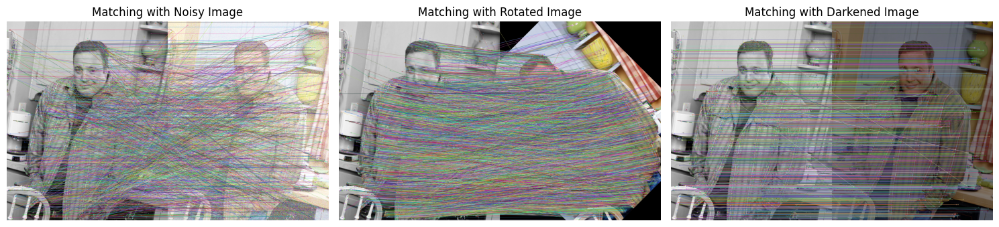

In [8]:
img2 = cv2.imread('noise_kevin_james.jpg')

gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

keypoints_2, descriptors_2 = sift.detectAndCompute(img2, None)

img3 = cv2.imread('rotated_kevin_james.jpg')

gray3 = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)

keypoints_3, descriptors_3 = sift.detectAndCompute(img3, None)

img4 = cv2.imread('darkened_kevin_james.jpg')

gray4 = cv2.cvtColor(img4, cv2.COLOR_BGR2GRAY)

keypoints_4, descriptors_4 = sift.detectAndCompute(img4, None)

# Pencocokan fitur menggunakan BFMatcher
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

# Pencocokan antara gambar asli dengan gambar lainnya
matches_noise = bf.match(descriptors_1, descriptors_2)
matches_rotated = bf.match(descriptors_1, descriptors_3)
matches_darkened = bf.match(descriptors_1, descriptors_4)

# Sort the matches based on distance (quality of the match)
matches_noise = sorted(matches_noise, key=lambda x: x.distance)
matches_rotated = sorted(matches_rotated, key=lambda x: x.distance)
matches_darkened = sorted(matches_darkened, key=lambda x: x.distance)

print("Noise: ", len(matches_noise))
print("Rotated: ", len(matches_rotated))
print("Darkened: ", len(matches_darkened))

img_matches_noise = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches_noise, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
img_matches_rotated = cv2.drawMatches(img1, keypoints_1, img3, keypoints_3, matches_rotated, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
img_matches_darkened = cv2.drawMatches(img1, keypoints_1, img4, keypoints_4, matches_darkened, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Tampilkan gambar pencocokan
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img_matches_noise, cv2.COLOR_BGR2RGB))
plt.title('Matching with Noisy Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(img_matches_rotated, cv2.COLOR_BGR2RGB))
plt.title('Matching with Rotated Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(img_matches_darkened, cv2.COLOR_BGR2RGB))
plt.title('Matching with Darkened Image')
plt.axis('off')

plt.tight_layout()
plt.show()

Saya menggunakan BFMatchers untuk melakukan match terhadap gambar:

Algoritma Pencocokan:
- SIFT (Scale-Invariant Feature Transform) digunakan untuk mendeteksi keypoints dan mengekstraksi descriptor fitur pada semua gambar (gambar asli, noise, dirotasi, dan digelapkan).
- BFMatcher (Brute-Force Matcher) digunakan untuk mencocokkan descriptor yang dihasilkan dari gambar asli dengan descriptor gambar lainnya. BFMatcher membandingkan setiap descriptor dari satu gambar dengan semua descriptor dari gambar lain untuk menemukan pasangan terbaik.

Hasil Pencocokan:
1. Pencocokan dengan Gambar Ber-noise:
Pada gambar ber-noise, pencocokan fitur masih berjalan dengan baik. SIFT tetap mampu mendeteksi dan mencocokkan banyak fitur meskipun ada gangguan noise. Seperti terlihat pada visualisasi, garis pencocokan menunjukkan banyak pasangan titik yang sesuai antara gambar asli dan gambar dengan noise.
2. Pencocokan dengan Gambar yang Dirotasi:
Jumlah pencocokan terbesar ditemukan pada gambar yang diputar, menunjukkan bahwa SIFT sangat efektif dalam menangani rotasi. Meskipun gambar mengalami rotasi, banyak fitur yang masih cocok dengan gambar asli. Hal ini karena SIFT dirancang untuk skala dan rotasi-invariant, artinya dapat mengenali fitur meskipun gambar telah dirotasi.
3. Pencocokan dengan Gambar yang Digelapkan:
Pencocokan dengan gambar yang lebih gelap terdapat beberapa penurunan kualitas pencocokan dimana ada keypoints yang tidak match. Pengurangan kecerahan bisa menyebabkan beberapa fitur menjadi kurang jelas, sehingga mengurangi jumlah fitur yang dapat dicocokkan dengan akurat. Namun, SIFT masih berhasil mencocokkan sejumlah fitur yang signifikan di kedua gambar.

**Apakah SIFT dapat melakukan pencocokan yang baik di semua kondisi?**
1. Noise: SIFT masih dapat mendeteksi dan mencocokkan fitur dalam gambar yang penuh noise, namun jumlah pencocokannya lebih rendah dibanding gambar yang dirotasi. Ini menunjukkan bahwa SIFT cukup baik dalam menghadapi noise, meskipun ada penurunan performa karena beberapa fitur asli gambar bisa kabur atau tertutup oleh noise. Garis pencocokan terlihat agak acak, menandakan bahwa noise mempengaruhi keakuratan pencocokan.
2.Rotasi: Pencocokan paling banyak terjadi pada gambar yang dirotasi, menunjukkan bahwa SIFT sangat baik dalam menangani rotasi. Algoritma SIFT memang dirancang untuk invarian terhadap rotasi, dan hasil ini mendukung teori tersebut. Garis pencocokan tampak teratur, menunjukkan bahwa fitur-fitur yang sesuai dapat ditemukan meskipun gambar dirotasi.
3. Perubahan Pencahayaan: Pencocokan pada gambar yang digelapkan lebih rendah daripada gambar noisy atau rotated. Meskipun SIFT secara teoritis seharusnya tahan terhadap perubahan pencahayaan, hasil yang didapatkan menunjukkan bahwa SIFT kurang optimal ketika gambar cukup gelap. Ini kemungkinan terjadi karena beberapa fitur penting di gambar asli menjadi kurang terlihat atau hilang dalam kondisi gelap yang ekstrim. Namun, SIFT tetap bisa menemukan beberapa fitur di area yang lebih terang.

### Part D

**Pemfilteran Gaussian**

Untuk mendeteksi fitur yang skala-invariant (tidak berubah pada berbagai ukuran objek di gambar), SIFT menggunakan pendekatan berbasis Laplacian of Gaussian (LoG). Namun, menghitung LoG secara langsung mahal secara komputasi. Untuk mengatasi hal ini, SIFT mendekati LoG dengan menggunakan Difference of Gaussians (DoG), yang lebih efisien namun memberikan hasil yang serupa.

1. Gaussian Blur: Proses dimulai dengan mengaburkan gambar pada berbagai tingkat menggunakan filter Gaussian dengan lebar (sigma) yang berbeda. Fungsi Gaussian adalah fungsi pembobotan yang halus untuk menyingkirkan detail kecil dan kebisingan, memungkinkan deteksi fitur pada skala yang berbeda.

2. Difference of Gaussians (DoG): Setelah gambar dihaluskan dengan berbagai filter Gaussian, gambar yang telah dihaluskan dikurangi satu sama lain untuk mendapatkan gambar DoG. Hasilnya adalah serangkaian gambar yang mewakili perubahan (perbedaan) antara gambar yang lebih halus dan gambar yang lebih tajam.

**Deteksi Ekstremum Skala**

Proses ini adalah inti dari deteksi titik kunci (keypoint). SIFT mencari ekstremum lokal (maksimum atau minimum) di dalam gambar DoG yang menunjukkan kemungkinan keypoints (fitur).

Untuk setiap piksel dalam gambar DoG, SIFT memeriksa apakah piksel tersebut adalah ekstremum lokal dengan membandingkannya dengan piksel tetangga di semua arah (di ruang 3D, yaitu dua dimensi gambar dan satu dimensi skala). Sebuah piksel dianggap sebagai ekstremum lokal jika nilai intensitasnya lebih besar atau lebih kecil dari semua piksel tetangga dalam skala yang sama dan juga pada skala di atas dan di bawahnya.

Ekstremum lokal yang ditemukan inilah yang diidentifikasi sebagai kandidat keypoints.

**Peran Octave**

Keypoints dideteksi dengan membandingkan nilai piksel di berbagai skala (octave), memungkinkan deteksi fitur yang konsisten meskipun skala gambar berubah. Octave memungkinkan deteksi fitur pada berbagai resolusi, sehingga SIFT dapat bekerja secara skala-invariant.

## Soal 2

### Part A

In [9]:
img5 = cv2.imread('sharp_painting.jpg')

gray5 = cv2.cvtColor(img5, cv2.COLOR_BGR2GRAY)

img6 = cv2.imread('painting_in_museum.jpg')

gray6 = cv2.cvtColor(img6, cv2.COLOR_BGR2GRAY)

sift = cv2.xfeatures2d.SIFT_create()

keypoints_5, descriptors_5 = sift.detectAndCompute(img5, None)
keypoints_6, descriptors_6 = sift.detectAndCompute(img6, None)

FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params, search_params)

matches = flann.knnMatch(descriptors_5, descriptors_6, k=2)

good_matches = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good_matches.append(m)

if len(good_matches) > 10:
    src_pts = np.float32([keypoints_5[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([keypoints_6[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    print("Homography matrix:\n", H)
else:
    print("Not enough matches are found - {}/{}".format(len(good_matches), 10))

Homography matrix:
 [[ 7.85220643e-01 -1.17294686e-02  4.02480407e+02]
 [-4.67915379e-03  7.77412695e-01  8.13399751e+01]
 [-2.22263174e-06 -2.20699741e-05  1.00000000e+00]]


### Part B

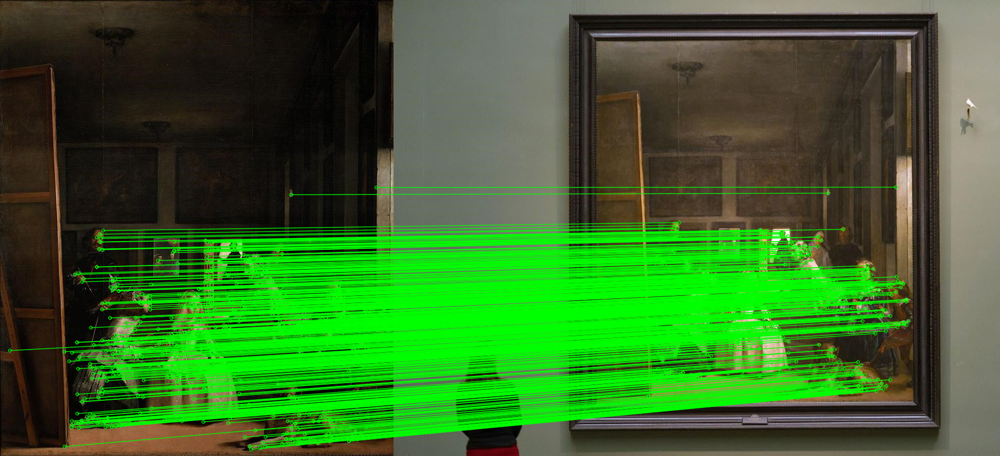

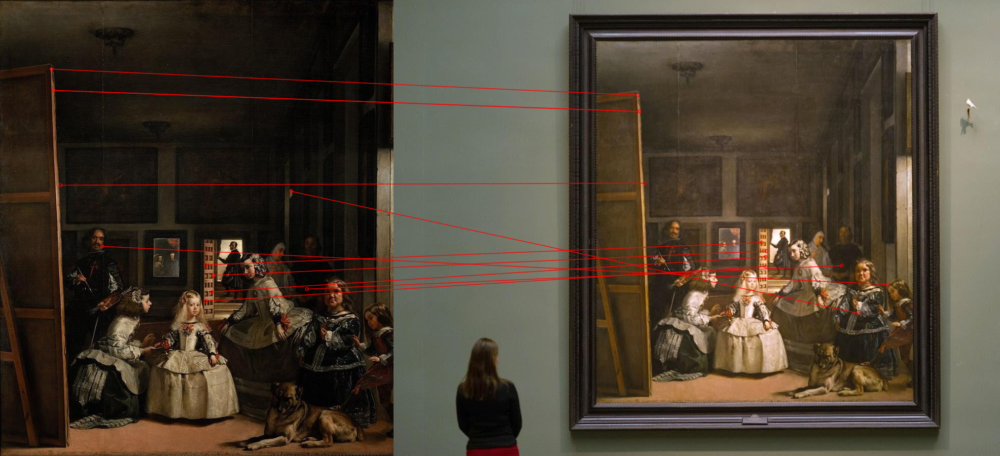

In [10]:
from google.colab.patches import cv2_imshow

if len(good_matches) > 10:
  inlier_matches = []
  outlier_matches = []

  matches_mask = mask.ravel().tolist()

  for i, match in enumerate(good_matches):
      if matches_mask[i]:
          inlier_matches.append(match)
      else:
          outlier_matches.append(match)

  img_inliers = cv2.drawMatches(img5, keypoints_5, img6, keypoints_6, inlier_matches, None, matchColor=(0, 255, 0), flags=2)
  img_outliers = cv2.drawMatches(img5, keypoints_5, img6, keypoints_6, outlier_matches, None, matchColor=(0, 0, 255), flags=2)

  cv2_imshow(img_inliers)
  cv2_imshow(img_outliers)

### Part C

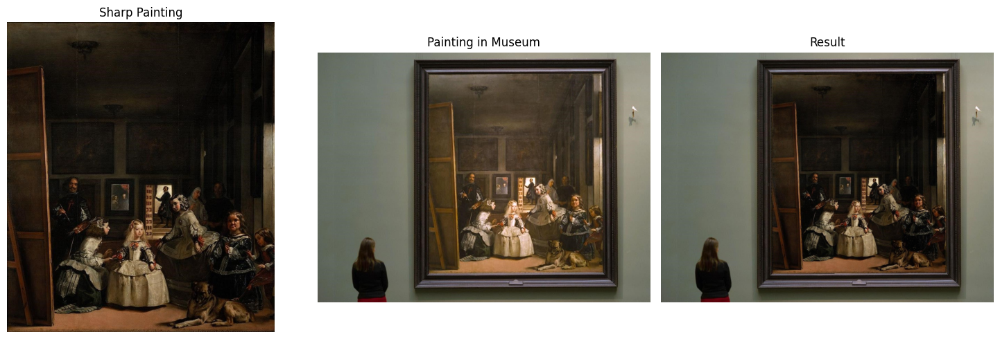

In [11]:
h, w = img6.shape[:2]

warped_painting = cv2.warpPerspective(img5, H, (w, h))

gray_warped = cv2.cvtColor(warped_painting, cv2.COLOR_BGR2GRAY)
_, mask = cv2.threshold(gray_warped, 1, 255, cv2.THRESH_BINARY)

mask_inv = cv2.bitwise_not(mask)

museum_bg = cv2.bitwise_and(img6, img6, mask=mask_inv)

painting_fg = cv2.bitwise_and(warped_painting, warped_painting, mask=mask)

result = cv2.add(museum_bg, painting_fg)

img5_rgb = cv2.cvtColor(img5, cv2.COLOR_BGR2RGB)
img6_rgb = cv2.cvtColor(img6, cv2.COLOR_BGR2RGB)
result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(img5_rgb)
plt.title('Sharp Painting')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(img6_rgb)
plt.title('Painting in Museum')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(result_rgb)
plt.title('Result')
plt.axis('off')

plt.tight_layout()
plt.show()

### Part D

Konsep RANSAC (Random Sample Consensus) dalam proses alignment gambar bertujuan untuk mengatasi permasalahan outlier ketika mencocokkan fitur antara dua gambar yang berbeda. Dalam konteks alignment gambar, RANSAC digunakan untuk menghitung transformasi (misalnya matriks homografi) dengan memperkirakan model terbaik dari sekumpulan data yang dicemari oleh outlier.

RANSAC bekerja dengan prinsip sebagai berikut:
1. Sampling Acak: Secara acak memilih subset dari pasangan titik yang cocok (matches) antara dua gambar.
2. Model Estimasi: Dengan menggunakan subset ini, model (dalam hal ini homografi) dihitung.
3. Inlier Evaluation: Kemudian model tersebut dievaluasi terhadap seluruh data, di mana pasangan titik yang sesuai dengan model dalam batas toleransi tertentu dianggap sebagai inlier, sementara pasangan titik yang menyimpang jauh dianggap sebagai outlier.
4. Iterasi: Proses ini diulang berkali-kali, dan model terbaik yang menghasilkan inlier terbanyak dipilih sebagai hasil akhir.


Pada bagian A:
Setelah melakukan deteksi (keypoints) dengan SIFT, dilakukan pencocokan antara fitur dari dua gambar yang ingin di-align. RANSAC digunakan untuk menghitung homography matrix (H). Matriks homografi ini merepresentasikan transformasi geometris antara kedua gambar. Sehingga, RANSAC memilih subset pasangan titik (fitur yang terdeteksi) dan menghitung homografi dengan hanya mempertimbangkan inlier.

Tanpa RANSAC, pencocokan fitur mungkin akan rusak oleh outlier, yang mengakibatkan kesalahan dalam transformasi dan alignment gambar. Hal ini disebabkan karena adanya inliner. Inliner sendiri adalah titik yang cocok/match dengan gambar/model yang dievaluasi. Dengan menggunakan inliner, kita menghitung model transformasi nya (homografi matriks).